# ***Coronavirus tweets - Text Classification / Sentiment Analysis***

[Kaggle Dataset](https://www.kaggle.com/datasets/datatattle/covid-19-nlp-text-classification/data)

This TP is relatively light coding-wise, please focus on the questions

⚠️Answers mindlessly copied from chatGPT will be penalized⚠️


For those running on a poetry environment, you will probably need to run:

```bash
!poetry add seaborn plotly sklearn xgboost
```

In [2]:
!poetry add seaborn plotly sklearn xgboost

The following packages are already present in the pyproject.toml and will be skipped:

  • seaborn
  • plotly
  • sklearn
  • xgboost

If you want to update it to the latest compatible version, you can use `poetry update package`.
If you prefer to upgrade it to the latest available version, you can use `poetry add package@latest`.

Nothing to add.


In [3]:
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import re
import numpy as np

from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from xgboost import XGBClassifier

## ***Reading Data***

In [4]:
df = pd.read_csv("./data/Corona_NLP.csv", index_col=0)
print(df.shape)
df.head()

(44955, 6)


,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative


## ***Data Exploration***

In [5]:
class_labels = ["Extremely Negative", "Negative", "Neutral", "Positive", "Extremely Positive"]
category_orders = {"Sentiment": class_labels}

# use the value_counts function on the Sentiment column to print the class distribution # https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html
# use px.histogram to visualize the distribution, you can include the above parameters # https://plotly.com/python/histograms/

df["Sentiment"].value_counts()
px.histogram(df, x="Sentiment", category_orders=category_orders, color="Sentiment")


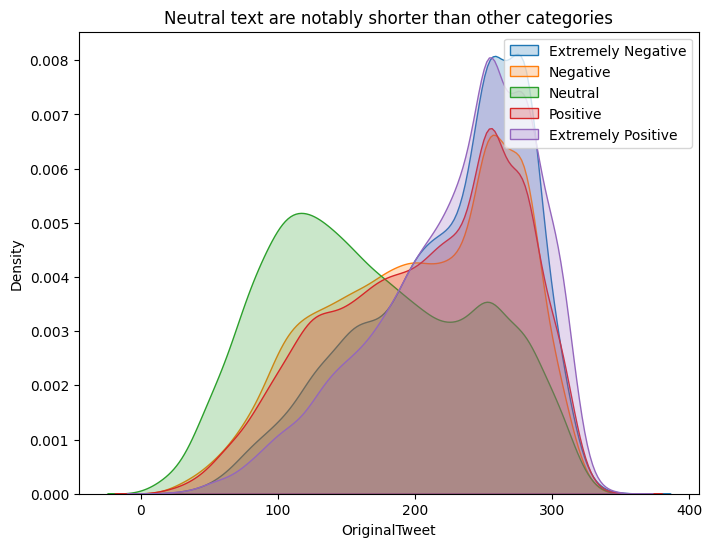

In [6]:
plt.figure(figsize=(8,6))

# use the sns.kdeplot function to visualize text length for each class # https://seaborn.pydata.org/generated/seaborn.kdeplot.html
for sentiment in class_labels:
    sns.kdeplot(df[df["Sentiment"] == sentiment]["OriginalTweet"].str.len(), fill=True, label=sentiment)

plt.title("Neutral text are notably shorter than other categories")
plt.legend()
plt.show()

What do you observe on this plot ? Could this be important in the future ?
* ***Your** thoughts here*

text lenght seems to have un impact. we may consider it to predict the sentiment. (I should have given the same color for each sentiment than on the first plot but I prefered to focus on other things)


## ***Preprocessing***

Here's the preprocessing function we'll use today:

* Removing twitter handles and url
* Tokenizing the text
* Lowering and removing non alphanumeric characters
* Removing stopwords
* Lemmatizing

In [7]:
def remove_twitter_handles_url(text):
    twitter_handle_pattern = r'@[\w_]+'
    url_pattern = r'https?://\S+|www\.\S+'
    
    no_handle = re.sub(twitter_handle_pattern, '', text)
    cleaned_text = re.sub(url_pattern, '', no_handle)

    return cleaned_text

def preprocess_text(text):
    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))

    cleaned_text = remove_twitter_handles_url(text)
    # Tokenization
    tokens = word_tokenize(cleaned_text)
    # Remove punctuation and convert to lowercase
    words = [word.lower() for word in tokens if word.isalnum()]
    # Remove stopwords
    words = [word for word in words if word not in stop_words]
    # Lemmatization using WordNetLemmatizer
    words = [lemmatizer.lemmatize(word) for word in words]
    
    return ' '.join(words)

## ***Feature extraction***

Let's apply the Bag of Words encoding to some processed text and visualize the output vector

In [8]:
# apply the preprocess function to the first 200 rows of the dataframe 
processed = df.iloc[:200]["OriginalTweet"].apply(preprocess_text)
processed

0                                                       
1      advice talk neighbour family exchange phone nu...
2      coronavirus australia woolworth give elderly d...
3      food stock one empty please panic enough food ...
4      ready go supermarket covid19 outbreak paranoid...
                             ...                        
195    kept hearing boomer gon na travel cheap flight...
196    gt announces 10m loan fund administered provid...
197    pasta pasta sauce pizza sold grocery store eve...
198    panic fear fear mind killer pres working priva...
199    retail store closed end march keep staff custo...
Name: OriginalTweet, Length: 200, dtype: object

In [9]:
# instantiate count vectorizer # https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html
bag_of_words = CountVectorizer()
# fit and transform (at once) the preprocessed text (look through the documentation for the appropriate class method)
processed_vectors = bag_of_words.fit_transform(processed)
processed_vectors

<200x1561 sparse matrix of type '<class 'numpy.int64'>'
	with 3410 stored elements in Compressed Sparse Row format>

What do the dimensions of the Bag of Words vectors correspond to ?
* Dimension 1: number of text
* Dimension 2: number of unique word

In [11]:
# convert the processed vectors to arrays (look at the "examples" section in the docs) and create a dataframe based on those vectors
bag_of_words_df = pd.DataFrame(processed_vectors.toarray()) # , columns=bag_of_words.get_feature_names_out()
bag_of_words_df


,0,1,2,3,4,5,6,7,8,9,...,1551,1552,1553,1554,1555,1556,1557,1558,1559,1560
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
196,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
197,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
198,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [12]:
color_continuous_scale='RdBu_r'

# use the px.imshow plotly function to visualize your dataframe, use the above colorscale 
# https://plotly.com/python/imshow/ 

px.imshow(bag_of_words_df, color_continuous_scale='RdBu_r', title="Representation of [200 x 1561] Bag of Words encodings")

Looking at the vectorized text:
* Is the term "sparse representation" justified ?
    * ***Your** thoughts here*
    Most of the values are 0 so it looks justified
* Does this look efficient ?
    * ***Your** thoughts here*
   It does not seems efficient at all as for each sentces we will have 1561 words even if the sentences contains only 3 words

In [13]:
tfidf = TfidfVectorizer()
processed_vectors = tfidf.fit_transform(processed)
processed_vectors

<200x1561 sparse matrix of type '<class 'numpy.float64'>'
	with 3410 stored elements in Compressed Sparse Row format>

In [14]:
tfidf_df = pd.DataFrame(processed_vectors.toarray()) # , columns=tfidf.get_feature_names_out() to give unique word as columns names
tfidf_df

,0,1,2,3,4,5,6,7,8,9,...,1551,1552,1553,1554,1555,1556,1557,1558,1559,1560
0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
196,0.0,0.0,0.0,0.235625,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
197,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
198,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [14]:
# use imshow to plot the vector representations
px.imshow(bag_of_words_df, color_continuous_scale='RdBu_r', title="Representation of [200 x 1561] Bag of Words encodings")

## ***Label encoding and train/test split***

Now that we've vectorized the text, we want to encode the class labels and create a train/test split

In [15]:
label_encoder = LabelEncoder()
df['Sentiment_enc'] = label_encoder.fit_transform(df['Sentiment'])

In [16]:
X = df['OriginalTweet']
y = df['Sentiment_enc']


test_size=0.2 
random_state=42

# use the train_test_split function with the above test size and random seed
X_train, X_test, y_train, y_test =  train_test_split(X,y, test_size=test_size, random_state=random_state)

## ***Model Definition***

Now we'll define a pipeline. This pipeline will take raw tweets as input, preprocess and vectorize them, before fitting a classification model to it.
Use the [documentation](https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html#sklearn.pipeline.Pipeline) to instantiate your pipeline:
* Step 1: [Count vectorizer](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html), ***using our preprocessing function as preprocessor***
* Step 2: A classification model, here a [Multinomial Naive Bayes](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html#sklearn.naive_bayes.MultinomialNB)

In [17]:
text_clf = Pipeline([
    ('count', CountVectorizer()),
    ('clf', MultinomialNB()),
])

## ***Training***

In [18]:
# fit the pipeline to the training data 
text_clf.fit(X_train, y_train)

Pipeline(steps=[('count', CountVectorizer()), ('clf', MultinomialNB())])

## ***Prediction***

In [19]:
# Use the pipeline to run predictions on the test data
y_pred =  text_clf.predict(X_test)

## ***Results visualization***

In [20]:
# styling the confusion matrix
confusion_matrix_kwargs = dict(
    text_auto=True, 
    title="Confusion Matrix", width=1000, height=800,
    labels=dict(x="Predicted", y="True Label"),
    x=class_labels,
    y=class_labels,
    color_continuous_scale='Blues'
)

def report(y_true, y_pred, class_labels):
    print(classification_report(y_true, y_pred, target_names=class_labels))
    # print a classification report of the predictions # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html#sklearn-metrics-classification-report
    # create a confusion matrix and pass it to imshow to visualize it # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html#sklearn.metrics.confusion_matrix
    # (the confusion_matrix_kwargs are here for styling only)
    matrix = confusion_matrix(y_true, y_pred)
    fig = px.imshow(
        matrix,
        **confusion_matrix_kwargs
        )
    fig.show()

In [21]:
class_labels = label_encoder.inverse_transform(range(5))
# call the report function to visualize the classification results, use the above class_labels
report(y_test, y_pred, class_labels)

                    precision    recall  f1-score   support

Extremely Negative       0.71      0.24      0.36      1189
Extremely Positive       0.66      0.30      0.41      1457
          Negative       0.42      0.56      0.48      2204
           Neutral       0.76      0.27      0.40      1681
          Positive       0.39      0.70      0.50      2460

          accuracy                           0.46      8991
         macro avg       0.59      0.42      0.43      8991
      weighted avg       0.55      0.46      0.45      8991



## ***What happened here ?***
Looking at the confusion matrix:

* What are some examples of classes that are confused with one another ?
    * ***Your** thoughts here*
    
    we can notice that the model predict way too much sentence as positive. this class is confused with almost every others class except Extremely negative. aproximately the same probleme with negative.
* The "Neutral" class has 68% precision and 34% recall, what does this mean ?
    * ***Your** thoughts here*
    
    it means that 68% of the element that we labelled as Neutral are real Neutral (TP/(TP+FP)) and that we identified only 34% of total neutral. in other words, when the model classify a sentence as neutral it has good chance that it is really neutral but it miss a lot of real neutral. 
    

## ***Let's try with TD-IDF***

But first, let's define a [class](https://www.w3schools.com/python/python_classes.asp) that will make iterating through different architectures and vectorizers a lot faster

In [22]:
class Model:
    def __init__(self, X, y, model_architecture, vectorizer, random_seed=42, test_size=0.2) -> None:
        self.X = X
        self.y = y
        self.model_instance = model_architecture
        self.vectorizer = vectorizer
        self.random_seed = random_seed
        self.test_size = test_size

        self.pipeline = Pipeline([
            ('vectorizer', self.vectorizer),
            ('model', self.model_instance)
        ])

        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X, self.y, test_size=self.test_size, random_state=self.random_seed)

    def preprocess(self, text):
        def remove_twitter_handles_url(text):
            twitter_handle_pattern = r'@[\w_]+'
            url_pattern = r'https?://\S+|www\.\S+'
            
            no_handle = re.sub(twitter_handle_pattern, '', text)
            cleaned_text = re.sub(url_pattern, '', no_handle)

            return cleaned_text
        
        lemmatizer = WordNetLemmatizer()
        stop_words = set(stopwords.words('english'))
        cleaned_text = remove_twitter_handles_url(text)
        tokens = word_tokenize(cleaned_text)
        words = [word.lower() for word in tokens if word.isalnum()]
        words = [word for word in words if word not in stop_words]
        words = [lemmatizer.lemmatize(word) for word in words]
        
        return ' '.join(words)
    
    def fit(self):
        # fit self.pipeline to the training data
        self.pipeline.fit(self.X_train, self.y_train)

    def predict(self):
        return self.pipeline.predict(self.X_test)

    
    def predict_proba(self):
        return self.pipeline.predict_proba(self.X_test)

        
    
    def report(self, y_true, y_pred, class_labels):
        # the report function as defined previously
        print(classification_report(y_true, y_pred, target_names=class_labels))
            # print a classification report of the predictions # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html#sklearn-metrics-classification-report
            # create a confusion matrix and pass it to imshow to visualize it # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html#sklearn.metrics.confusion_matrix
            # (the confusion_matrix_kwargs are here for styling only)
        matrix = confusion_matrix(y_true, y_pred)
        fig = px.imshow(
            matrix,
            **confusion_matrix_kwargs
            )
        fig.show()
        
        

In [23]:
# instantiate the Model class with text and labels (X and y), a multinomial naive bayes model and a tfidf vectorizer
model = Model(X, y, MultinomialNB(), TfidfVectorizer())
# fit the model
model.fit()
# predict and generate classification report
y_pred = model.predict()
model.report(y_test, y_pred, class_labels)

class_labels=label_encoder.inverse_transform(range(5))

                    precision    recall  f1-score   support

Extremely Negative       1.00      0.01      0.02      1189
Extremely Positive       1.00      0.01      0.02      1457
          Negative       0.42      0.40      0.41      2204
           Neutral       0.85      0.04      0.08      1681
          Positive       0.34      0.92      0.49      2460

          accuracy                           0.36      8991
         macro avg       0.72      0.28      0.20      8991
      weighted avg       0.65      0.36      0.25      8991



* What is the model's behaviour ?
    * ***Your** thoughts here*

    the model predict almost everything as positive and negative (mainly positive) it is only able to detect 2 class
* Is this a sign of overfitting, underfitting ?
    * ***Your** thoughts here*
    
    In my opinion it is  sign of underfitting as the model is not able to separate the element in 5 class. On the other hand overfitting mean that the model would be too much specific and then making error whiwh is not the case there
* Why could the model be biased towards the positive and negative classes ?
    * ***Your** thoughts here*

First, the dataset is unbalanced as it contains more negative and positive element. also, extremely positive / negative is just a nuances and as the model istoo simple it is not able to diferenciate
* Naive Bayes assumes that features (words) are conditionally independent given the class label. Between the two encodings we've tried, which one seems to better satisfy this assumption ? 
    * ***Your** thoughts here*
the count encoder has better result so we cans consider that it bettersatisfy this assumption what is logical when we look at the sfidf formula.
    

In [24]:
# instantiate the Model class with text and labels (X and y), a logistic regression model and a tfidf vectorizer
model = Model(X, y, LogisticRegression(), TfidfVectorizer())
# fit the model
model.fit()
# predict and generate classification report
y_pred = model.predict()
model.report(y_test, y_pred, class_labels)
class_labels=label_encoder.inverse_transform(range(5))

                    precision    recall  f1-score   support

Extremely Negative       0.61      0.49      0.54      1189
Extremely Positive       0.71      0.55      0.62      1457
          Negative       0.52      0.54      0.53      2204
           Neutral       0.66      0.67      0.66      1681
          Positive       0.52      0.62      0.57      2460

          accuracy                           0.58      8991
         macro avg       0.60      0.57      0.58      8991
      weighted avg       0.59      0.58      0.58      8991



/Users/delaygues/nlp_courses/.venv/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



## ***Results analysis***

Looking at the confusion matrix and the classification report:
* What has improved compared to Naive Bayes ?
    * ***Your** thoughts here*

    The model is able to predict element of every classes and we can notice that element on the diagonal are the most frequent so most of element has been well classified
* Are the confused classes still the same ? Why ?
    * ***Your** thoughts here*

    No actually the major confused classes are positive / extremely positive and negative / extremely negative. for the others it seems to be "correct" result not excelent but correct
* Are there mistakes that are more understandable/acceptable than others ?
    * ***Your** thoughts here*

    Yes, it is acceptable to make mistakes between positive/ extremly positive than between extremely positive / extremely negative or similar things. 
* Given the confused classes, what could be done to make the task easier ?
    * ***Your** thoughts here*

    we may just consider 3 class: positive, negative, neutral but we will loose information that can be really useful depending of the use

## ***Investigate wrong predictions***

Let's take a look at the errors:

In [25]:
test_data = pd.concat((X_test, y_test), axis=1)
test_data["pred"] = y_pred
# using np.where, create a variable equal to one when the encoded sentiment and model prediction match
test_data["correct_prediction"] = np.where(test_data["Sentiment_enc"] == test_data["pred"], 1, 0)
test_data


,OriginalTweet,Sentiment_enc,pred,correct_prediction
33054,https://t.co/2yMUPatIYU Wear a mask! Especiall...,1,1,1
33564,"In light of Covid-19, Canada's insurers are re...",4,4,1
32707,@ate_ted @SenTedCruz Supply &amp; Demand. COVI...,4,2,0
13252,Around 9 million people die of hunger and hung...,0,0,1
37837,Alarming but informative video everyone should...,1,1,1
...,...,...,...,...
21791,This #Quarantine really has done a number on m...,4,4,1
19570,Panic buying amidst concerns don t mix well wi...,2,2,1
11987,IÂve come in contact with more people while t...,3,4,0
738,Woman of 67 works in a grocery store in the US...,0,0,1


In [26]:
test_data["pred_label"] = test_data.pred.apply(lambda x: label_encoder.inverse_transform([x])[0])
px.histogram(test_data, x="pred_label", 
             color="correct_prediction", 
             category_orders=category_orders, 
             barmode="stack", 
            )

In [27]:
generator = test_data[test_data["correct_prediction"] == 0].head(20).iterrows()

## ***Execute the following cell a bunch of times to assess the quality of the model***

* Do you agree with the model predictions ? Do they make sense ? 
  * Give some examples
  * ***Your** thoughts here*

  most of mistakes made by the model are understandable in my opinion. from what I see, a lot of people use negative / positive word in their tweet but the sentence has the oposite sense. the model has problem to detect sarcarsm, irony,... 

  It seems to classify negative a sentence that has a lot of negative word but in reality even if we use more negative word it may be positive. for exemple  ***"supply amp demand going impact demand indefinitely cut back production worldwide supply decreased significantly go gas price plus little thing like tire cou"*** sounds optimistic then positive even if negative word as decreased, impact demand indefinitely. 
  
   By the way I'm not sure that the model is able to differenciate a sentence with negative construction. for exemple: *** it will not be so bad *** the model wil classify as negative as he understand "not" and "bad" separately.

In [28]:
next_sample = next(generator)[1]

print(f"Tweet: {next_sample['OriginalTweet']}\n")
print(f"Processed Tweet: {preprocess_text(next_sample['OriginalTweet'])}\n")
print(f"True label: {label_encoder.inverse_transform([next_sample['Sentiment_enc']])}")
print(f"Prediction: {label_encoder.inverse_transform([next_sample['pred']])}")

Tweet: @ate_ted @SenTedCruz Supply &amp; Demand. COVID-19 is not going to impact demand indefinitely. Russia/Saudi will cut back production, but worldwide supply will have been decreased significantly. There goes your gas prices plus little things like tires cou

Processed Tweet: supply amp demand going impact demand indefinitely cut back production worldwide supply decreased significantly go gas price plus little thing like tire cou

True label: ['Positive']
Prediction: ['Negative']


## ***Check the probability distribution of predictions***

In this section, we want to take a look at the probabilities given by the model. They can sometimes be useful to improve the quality of the model by getting rid of samples with low certainty (low maximum probability).

*Intuition:* Imagine a text for which the model assigns the following probabilities:
* Extremely Positive: 15%
* Extremely Negative: 4%
* Positive: 31%
* Negative: 29%
* Neutral: 21%

The prediction would be "Positive". However, there are only 3% of difference with "Negative", can you really trust the model prediction in this case ?

In [168]:
probas = pd.DataFrame(lr.predict_proba())
probas.columns = label_encoder.inverse_transform(probas.columns)
probas.head()

NameError: name 'lr' is not defined

In [ ]:
probas.describe()

,Extremely Negative,Extremely Positive,Negative,Neutral,Positive
count,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000
mean,0.136675,0.164401,0.241119,0.183092,0.274713
std,0.168845,0.195731,0.152796,0.174858,0.151476
min,0.000008,0.000011,0.000069,0.000015,0.000391
25%,0.032350,0.036027,0.124135,0.044018,0.159858
50%,0.070062,0.081377,0.217835,0.125224,0.258326
75%,0.167299,0.213856,0.335942,0.272104,0.376609
max,0.977328,0.995103,0.843550,0.873715,0.806921


In [ ]:
plt.figure(figsize=(8,6))
sns.kdeplot(data=probas, fill=True, )
plt.title("Distribution of predicted probabilities")
plt.show()

NameError: name 'probas' is not defined

<Figure size 800x600 with 0 Axes>

## ***Result analysis***

* What can you conclude from the above probability distribution ?
* Does the model appear confident in its predictions ?
* How does it relate to the results obtained with the previous confusion matrices ?
  * ***Your** thoughts here*

  I can conclude that the model is really indecise and that is often has different possibilities with almost the same probabality too close to make a reliable decision

  
  comparated to the confusion matrix, the distribution of the probability of "positive" and "negative" classification is well distributed. it means that in almost every sentence you will have approximately 20% of chance to be in positive or in negative, due to this fact, to class a word in an other class it needs to be clearly dominant. This construction may cause other problem as for exemple 20% very negative, 24% negative, 25% positive,... this sentence will be considered as positive while it should be considered as very negative as 20% of very negative and 25% negative is clearly really negative. it explains the fact that most of element are in positive and negaive in the confusion matrix. they are just the most probale word, so it is difficult for others class to outperform.

## ***Solution 2: Change the class distribution***

In [32]:
{i: label_encoder.inverse_transform([i])[0] for i in range(5)}

{0: 'Extremely Negative',
 1: 'Extremely Positive',
 2: 'Negative',
 3: 'Neutral',
 4: 'Positive'}

In [33]:
new_mapping = {
    0:2, # extremely negative => negative
    1:4 # extremely positive => positive
}


In [34]:
df_reduced_labels = df.copy()
df_reduced_labels["Sentiment_enc"] = df_reduced_labels["Sentiment_enc"].map(new_mapping).fillna(df_reduced_labels["Sentiment_enc"])
category_orders = {"Sentiment_enc": ["Negative", "Neutral", "Positive"]}

print(round(df_reduced_labels.Sentiment_enc.value_counts(normalize=True)*100))
fig = px.histogram(df_reduced_labels, x="Sentiment_enc", 
             color="Sentiment_enc", 
             category_orders=category_orders, 
             title="Updated sentiment distribution",
             text_auto=True,
            )

fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = [2,3,4],
        ticktext = ["Negative", "Neutral", "Positive"]
    )
)
fig.show()

Sentiment_enc
4.0    44.0
2.0    38.0
3.0    19.0
Name: proportion, dtype: float64


In [35]:
X_reduced = df_reduced_labels['OriginalTweet']
y_reduced = df_reduced_labels['Sentiment_enc']


In [36]:
# as before, train a logistic regression model with TF-IDF encoding and plot the results
model = Model(X_reduced, y_reduced, LogisticRegression(), TfidfVectorizer())
model.fit()
y_pred = model.predict()
y_test_mapped = y_test.map(new_mapping).fillna(y_test)
print(classification_report(y_test_mapped, y_pred, target_names=["Negative", "Neutral", "Positive"]))


              precision    recall  f1-score   support

    Negative       0.80      0.83      0.82      3393
     Neutral       0.78      0.61      0.68      1681
    Positive       0.81      0.87      0.84      3917

    accuracy                           0.80      8991
   macro avg       0.80      0.77      0.78      8991
weighted avg       0.80      0.80      0.80      8991



/Users/delaygues/nlp_courses/.venv/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



## ***My turn***

In [41]:
from sklearn.tree import DecisionTreeClassifier

svc_clf = Model(X_reduced, y_reduced, DecisionTreeClassifier(), CountVectorizer())
svc_clf.fit()
y_pred = svc_clf.predict()
print(classification_report(y_test_mapped, y_pred, target_names=["Negative", "Neutral", "Positive"]))

              precision    recall  f1-score   support

    Negative       0.63      0.62      0.62      3393
     Neutral       0.50      0.56      0.53      1681
    Positive       0.68      0.65      0.66      3917

    accuracy                           0.62      8991
   macro avg       0.60      0.61      0.60      8991
weighted avg       0.62      0.62      0.62      8991



In [37]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = Model(X_reduced, y_reduced, RandomForestClassifier(), TfidfVectorizer())
rf_clf.fit()
y_pred = rf_clf.predict()
print(classification_report(y_test_mapped, y_pred, target_names=["Negative", "Neutral", "Positive"]))

              precision    recall  f1-score   support

    Negative       0.73      0.69      0.71      3393
     Neutral       0.64      0.52      0.57      1681
    Positive       0.70      0.80      0.75      3917

    accuracy                           0.70      8991
   macro avg       0.69      0.67      0.68      8991
weighted avg       0.70      0.70      0.70      8991



In [38]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = Model(X_reduced, y_reduced, RandomForestClassifier(), CountVectorizer())
rf_clf.fit()
y_pred = rf_clf.predict()
print(classification_report(y_test_mapped, y_pred, target_names=["Negative", "Neutral", "Positive"]))

              precision    recall  f1-score   support

    Negative       0.74      0.68      0.71      3393
     Neutral       0.68      0.52      0.59      1681
    Positive       0.70      0.82      0.75      3917

    accuracy                           0.71      8991
   macro avg       0.71      0.67      0.68      8991
weighted avg       0.71      0.71      0.71      8991



## ***Now it's your turn !***

### To achieve the ***"good"*** grade, test at least **two** more models of your choice and answer:
* Comment on the results you obtain, are they similar to the previous ones ? Why ?
    * ***Your** thoughts here*
    
    we notice a lot of variability in the result with basic (hyperparameters), finally logistic regression has the best result from these model that we tested. it is possible that random forest and decisiontree are overfiiting with basic hyperparameters.
* Do you think the poor results are a byproduct of the model we choose or the quality of the data ?
    * ***Your** thoughts here*
    
as we noticed variability between model we know that it has an importance but some of them seems to be a good start to work on. it is important to keep in mind that we did not modified hyperparameters (I didnot do it on purpose as I wanted to compare with the others). ny modifiying them we have better result. on the other hand I think quality of the data has un impact on our model and we will need to add some preprocessing function to clean datas better and probably to search others encoder that may be more adapted to our problem and model that we will use. the good model will be a combination of these element
* If you had to improve those results, what would you do ?
    * ***Your** thoughts here*
  
to improve the model I would try to clean better the datas, try to modify hyperpameter and use other models as boosting models. we may also try feature engineering 
### To achieve the ***"advanced"*** grade, try to improve or explain the results we obtained by experimenting with different techniques:
* For example, you could try some of those:
  * Balancing classes (oversampling or subsampling)
  * Applying class weights
  * Monitoring training curves
    * Implementing early stopping (models like XGBoost make it easier)
  * Applying normalization
  * Hyperparameter tuning
  * Or anything else you deem coherent

In [19]:
df.head()

(44955, 6)


,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative


In [21]:
df['Sentiment'].value_counts()

Sentiment
Positive              12369
Negative              10958
Neutral                8332
Extremely Positive     7223
Extremely Negative     6073
Name: count, dtype: int64

In [52]:
from sklearn.utils import resample

max_samples = df[df['Sentiment'] == 'Positive'].shape[0]
df_negative_upsampled = resample(df[df['Sentiment'] == 'Negative'], replace=True, n_samples=max_samples, random_state=42)
df_neutral_upsampled = resample(df[df['Sentiment'] == 'Neutral'], replace=True, n_samples=max_samples, random_state=42)
df_extremely_positive_upsampled = resample(df[df['Sentiment'] == 'Extremely Negative'], replace=True, n_samples=max_samples, random_state=42)
df_extremely_negative_upsampled = resample(df[df['Sentiment'] == 'Extremely Positive'], replace=True, n_samples=max_samples, random_state=42)

df_balanced = pd.concat([df[df['Sentiment'] == 'Positive'], df_negative_upsampled, df_neutral_upsampled, df_extremely_positive_upsampled, df_extremely_negative_upsampled])
df_balanced['Sentiment'].value_counts()



Sentiment
Positive              12369
Negative              12369
Neutral               12369
Extremely Negative    12369
Extremely Positive    12369
Name: count, dtype: int64

In [53]:
new_mapping = {
    "Extremely Negative": "Negative",
    "Negative": "Negative",
    "Neutral": "Neutral",
    "Positive": "Positive",
    "Extremely Positive": "Positive"
}

# Applying the mapping to the dataframe
df_reduced_labels = df_balanced.copy()
df_reduced_labels["Sentiment_enc"] = df_reduced_labels["Sentiment"].map(new_mapping)
df_reduced_labels['Sentiment_enc'].value_counts()

Sentiment_enc
Positive    24738
Negative    24738
Neutral     12369
Name: count, dtype: int64

In [55]:
max_samples = df_reduced_labels[df_reduced_labels['Sentiment_enc'] == 'Positive'].shape[0]
df_neutral_upsampled2 = resample(df_reduced_labels[df_reduced_labels['Sentiment_enc'] == 'Neutral'], replace=True, n_samples=max_samples, random_state=42)
df_balanced = pd.concat([df_reduced_labels[df_reduced_labels['Sentiment_enc'] == 'Positive'],df_reduced_labels[df_reduced_labels['Sentiment_enc'] == 'Negative'], df_neutral_upsampled2])
df_balanced['Sentiment_enc'].value_counts()



Sentiment_enc
Positive    24738
Negative    24738
Neutral     24738
Name: count, dtype: int64

In [63]:
# Preprocessing and splitting the data

# Using TfidfVectorizer to transform the text data
tfidf_vectorizer = TfidfVectorizer(max_features=5000, stop_words='english')
X_tfidf = tfidf_vectorizer.fit_transform(df_balanced['OriginalTweet'])

# Splitting the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_tfidf, df_balanced['Sentiment_enc'], test_size=0.2, random_state=42)

X_train.shape, X_test.shape


((59371, 5000), (14843, 5000))

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Initializing the logistic regression model
log_reg = LogisticRegression(solver='saga', max_iter=100, random_state=42)

# Defining hyperparameters for GridSearch
param_grid = {
    'C': [0.1, 1, 10, 100],
    'penalty': ['l1','l2', 'elasticnet'],
}

# Initializing GridSearchCV
grid_search = GridSearchCV(log_reg, param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Fitting the model with the training data
grid_search.fit(X_train, y_train)

# Getting the best hyperparameters
best_params = grid_search.best_params_

best_params


10 et l1 best result

In [66]:
print(classification_report(y_test, grid_search.predict(X_test)))

              precision    recall  f1-score   support

    Negative       0.89      0.87      0.88      4999
     Neutral       0.86      0.93      0.89      4954
    Positive       0.89      0.84      0.87      4890

    accuracy                           0.88     14843
   macro avg       0.88      0.88      0.88     14843
weighted avg       0.88      0.88      0.88     14843



In [65]:
from sklearn.metrics import accuracy_score

y_train_pred = grid_search.predict(X_train)
y_test_pred = grid_search.predict(X_test)

train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Score d'exactitude sur l'ensemble d'entraînement :", train_accuracy)
print("Score d'exactitude sur l'ensemble de test :", test_accuracy)


Score d'exactitude sur l'ensemble d'entraînement : 0.9302858297822169
Score d'exactitude sur l'ensemble de test : 0.879337061240989


### analysis 

After a lot of test (I kept only the best result in case that you want to run the notebook) we can notice that we have way better results. 

First as the datas were not well balanced I choose to oversample the dataset. Then, map the dataset into only 3 sentiment gave better result and I even choose to oversample again the dataset as neutral contained less element than the 2 others. 

I could have chosen to first map and then oversample direcly but I thought that it would be more intersting to map with the same amount of data: 12000 extremely positive + 12000 positive = 24000 posotive after mapping. after testing the 2 possibilities it confirmed my thoughts. then I used gridsearchCV to find best parameters and c = 10 and penalty = l1 gave the bst result. 

this way I found an interesting result of 0.88 of accuracy what is an interesting result.
## but 

I oversampled before to split the datas and this may lead to overfitting and to have biaised result even in the test dataset. To solve this issues I could split before with balanced test sample and oversample only on train datas. we should also verify on new datas never seen by the models and not only on these test datas